# Телеком

## Описание проекта

### Бизнес описание

Оператор связи «Ниединогоразрыва.ком» хочет научиться прогнозировать отток клиентов. Если выяснится, что пользователь планирует уйти, ему будут предложены промокоды и специальные условия.

Команда оператора собрала персональные данные о некоторых клиентах, информацию об их тарифах и договорах.

### Описание услуг

Оператор предоставляет два основных типа услуг:

1. Стационарную телефонную связь. Возможно подключение телефонного аппарата к нескольким линиям одновременно.
2. Интернет. Подключение может быть двух типов: через телефонную линию (DSL*,* от англ. *digital subscriber line*, «цифровая абонентская линия») или оптоволоконный кабель (*Fiber optic*).


Также доступны такие услуги:

- Интернет-безопасность: антивирус (*DeviceProtection*) и блокировка небезопасных сайтов (*OnlineSecurity*);
- Выделенная линия технической поддержки (*TechSupport*);
- Облачное хранилище файлов для резервного копирования данных (*OnlineBackup*);
- Стриминговое телевидение (*StreamingTV*) и каталог фильмов (*StreamingMovies*).

За услуги клиенты могут платить каждый месяц или заключить договор на 1–2 года. Доступны различные способы расчёта и возможность получения электронного чека.

### Описание данных

Данные состоят из файлов, полученных из разных источников:

- `contract.csv` — информация о договоре;
- `personal.csv` — персональные данные клиента;
- `internet.csv` — информация об интернет-услугах;
- `phone.csv` — информация об услугах телефонии.

Во всех файлах столбец `customerID` содержит код клиента.

Информация о договорах актуальна на 1 февраля 2020.

### Описание полей

- `BeginDate` - дата начала пользования услугами
- `EndDate` - дата окончания пользования услугами
- `Type` - тип договора
- `PaperlessBilling` - факт выставления счета на электронную почту
- `PaymentMetod` - способ оплаты
- `MonthlyCharges` - ежемесячные траты на услуги
- `TotalCharges` - всего потрачено на услуги
- `Dependents` - наличие иждивенцев
- `SeniorCitizen` - наличие пенсионного статуса по возрасту
- `Partner` - наличие супруга
- `MultipleLines` - наличие возможность ведения параллельных линий во время звонка

## Предварительный eda анализ данных

### Импорт библиотек

In [1]:
!pip install pandas-profiling

### Загрузка данных

In [3]:
try:
    # Локальный путь
    contract = pd.read_csv('C:/Users/v.anufrikov/Downloads/Практикум/final_provider/final_provider/contract.csv', index_col=0)
    internet = pd.read_csv('C:/Users/v.anufrikov/Downloads/Практикум/final_provider/final_provider/internet.csv', index_col=0)
    personal = pd.read_csv('C:/Users/v.anufrikov/Downloads/Практикум/final_provider/final_provider/personal.csv', index_col=0)
    phone = pd.read_csv('C:/Users/v.anufrikov/Downloads/Практикум/final_provider/final_provider/phone.csv', index_col=0)
except:
    # Серверный путь
    contract = pd.read_csv('/datasets/final_provider/contract.csv', index_col=0)
    internet = pd.read_csv('/datasets/final_provider/internet.csv', index_col=0)
    personal = pd.read_csv('/datasets/final_provider/personal.csv', index_col=0)
    phone = pd.read_csv('/datasets/final_provider/phone.csv', index_col=0)
finally:
    print('Download complete')

Download complete


> Собрали все в единый df, так как услуги не могут поставляться без контракта, подклюем все услуги у нему left join

In [4]:
df = pd.concat([contract, internet, personal, phone], axis=1)
df.head()

,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,gender,SeniorCitizen,Partner,Dependents,MultipleLines
customerID,,,,,,,,,,,,,,,,,,,
7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85,DSL,No,Yes,No,No,No,No,Female,0,Yes,No,NaN
5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5,DSL,Yes,No,Yes,No,No,No,Male,0,No,No,No
3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15,DSL,Yes,Yes,No,No,No,No,Male,0,No,No,No
7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75,DSL,Yes,No,Yes,Yes,No,No,Male,0,No,No,NaN
9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65,Fiber optic,No,No,No,No,No,No,Female,0,No,No,No


> Добавили поле таргета и поменяли тип у зачений Yes и No

In [5]:
list_name = ['PaperlessBilling','OnlineSecurity','OnlineBackup',
        'DeviceProtection','TechSupport','StreamingTV',
        'StreamingMovies','Partner','Dependents','MultipleLines','gender','EndDate','SeniorCitizen']


'''for i in list_name:
    if i == 'gender':
        df[i] = df[i].apply(lambda x: True if x == 'Female' else False)
    elif i == 'EndDate':
        df['escape'] = df['EndDate'].apply(lambda x: True if x == 'No' else False)
    elif i == 'SeniorCitizen':
        df[i] = df[i].apply(lambda x: True if x == 1 else False)
    else:
        df[i] = df[i].apply(lambda x: True if x == 'Yes' else False)'''

for i in list_name:
    if i == 'gender':
        df[i] = df[i].apply(lambda x: 1 if x == 'Female' else 0)
    elif i == 'EndDate':
        df['escape'] = df['EndDate'].apply(lambda x: 1 if x == 'No' else 0)
    elif i == 'SeniorCitizen':
        df[i] = df[i].apply(lambda x: 1 if x == 1 else 0)
    else:
        df[i] = df[i].apply(lambda x: 1 if x == 'Yes' else 0)

df.head()

,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,gender,SeniorCitizen,Partner,Dependents,MultipleLines,escape
customerID,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,2020-01-01,No,Month-to-month,1,Electronic check,29.85,29.85,DSL,0,1,0,0,0,0,1,0,1,0,0,1
5575-GNVDE,2017-04-01,No,One year,0,Mailed check,56.95,1889.5,DSL,1,0,1,0,0,0,0,0,0,0,0,1
3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,1,Mailed check,53.85,108.15,DSL,1,1,0,0,0,0,0,0,0,0,0,0
7795-CFOCW,2016-05-01,No,One year,0,Bank transfer (automatic),42.30,1840.75,DSL,1,0,1,1,0,0,0,0,0,0,0,1
9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,1,Electronic check,70.70,151.65,Fiber optic,0,0,0,0,0,0,1,0,0,0,0,0


> Используем библиотеку pandas_profiling для первичного eda анализа

In [6]:
ProfileReport(df, title="EDA анализ данных")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Создаем df для хранения результатов обучения

> В качестве метрики в задании мы выбрали эти 3 метрики которые не подвержены дисбалансу классов

In [7]:
df_result = pd.DataFrame(columns=['f1 score','roc_auc','accuracy'])

def result_write(model_name, f1, roc_auc, accuracy):
    df_result.loc[str(model_name), 'f1 score'] = f1
    df_result.loc[str(model_name), 'roc_auc'] = roc_auc
    df_result.loc[str(model_name), 'accuracy'] = accuracy

    return df_result

df_result.head()

,f1 score,roc_auc,accuracy



## План действий по разработке MVP для `Ниединогоразрыва.ком`

### Анализ df
- [x] EDA через ProfileReport
- [x] Создаем df для хранения результатов обучения несколькими моделями по метрикам F1, AUC-ROC и Accuracy

### Предобработка данных
- [x] Переименовать столбцы df привести к нижнему регистру
- [x] Заполнить все пустые значения отдельной категорией no_data для текстовых значений или 0 для числовых
- [x] Изменить тип данных у df к которому больше советуют значения
- [x] Придумать новые фичи на основе имеющихся данных (дата, срок жизни и тд)
- [x]  Выбрать столбца только с самой высокой корреляцией с полем таргета
- [x] Закодировать категориальные признаки

### Обучение модели через Pipline
- [x] Разбиение df на обучающую и тестовую выборку 75-25
- [x] Масштабируем признаки
- [x] Подбираем гиперпарметры через RandomizedSearchCV
- [x] Выполняем кросс валидацию
- [x] Записываем результаты обучения

### Тестирование MVP
- [x] Тестируем выбранную модель на тестовой выборке
- [x] Сравниваем выбранную модель с константной моделью (DummyClassifier)
- [x] Строим графики ROC кривой и смотрим отчет о категоризации (confusion_matrix, classification_report)
- [x] Делаем выводы по обученной модели и значимость выбранных признаков

### Отчет по MVP
- Введение проблемы
- Набор данных
- Особенности и обработка
- Модели и методы
- Результаты и обсуждение
- Вывод
- Ответы на вопросы тимлида

## Предобработка данных
### Переименовать столбцы df привести к нижнему регистру

In [8]:
df.columns

Index(['BeginDate', 'EndDate', 'Type', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'MultipleLines', 'escape'],
      dtype='object')

In [9]:
df = df.rename(columns={'BeginDate' : 'start_contract',
                        'EndDate' : 'end_contract',
                        'Type' : 'type',
                        'PaperlessBilling' : 'email_billing',
                        'PaymentMethod': 'payment_method',
                        'MonthlyCharges' : 'monthly_charges',
                        'TotalCharges' : 'total_changes',
                        'InternetService' : 'internet_service',
                        'OnlineSecurity' : 'online_security',
                        'OnlineBackup' : 'online_backup' ,
                        'DeviceProtection' : 'device_protection',
                        'TechSupport' : 'tech_support',
                        'StreamingTV' : 'streaming_tv',
                        'StreamingMovies' : 'streaming_movies',
                        'gender' : 'gender',
                        'SeniorCitizen' : 'senior_citizen',
                        'Partner' : 'partner',
                        'Dependents' : 'dependents',
                        'MultipleLines' : 'multiple_lines',
                        'escape': 'escape'})

### Изменить тип данных у df к которому больше советуют значения

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   start_contract     7043 non-null   object 
 1   end_contract       7043 non-null   object 
 2   type               7043 non-null   object 
 3   email_billing      7043 non-null   int64  
 4   payment_method     7043 non-null   object 
 5   monthly_charges    7043 non-null   float64
 6   total_changes      7043 non-null   object 
 7   internet_service   5517 non-null   object 
 8   online_security    7043 non-null   int64  
 9   online_backup      7043 non-null   int64  
 10  device_protection  7043 non-null   int64  
 11  tech_support       7043 non-null   int64  
 12  streaming_tv       7043 non-null   int64  
 13  streaming_movies   7043 non-null   int64  
 14  gender             7043 non-null   int64  
 15  senior_citizen     7043 non-null   int64  
 16  partner       

In [11]:
df['total_changes'] = pd.to_numeric(df['total_changes'], errors='coerce')
df['start_contract'] = df['start_contract'].astype('datetime64[ns]')
#df['end_contract'] =  pd.to_datetime(df['end_contract'], format='"%Y/%m/d%"', errors='coerce')

> Сначало получал ошибку из-за текстовых значений в этом поле

### Заполнить все пустые значения отдельной категорией no_data для текстовых значений или 0 для числовых

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   start_contract     7043 non-null   datetime64[ns]
 1   end_contract       7043 non-null   object        
 2   type               7043 non-null   object        
 3   email_billing      7043 non-null   int64         
 4   payment_method     7043 non-null   object        
 5   monthly_charges    7043 non-null   float64       
 6   total_changes      7032 non-null   float64       
 7   internet_service   5517 non-null   object        
 8   online_security    7043 non-null   int64         
 9   online_backup      7043 non-null   int64         
 10  device_protection  7043 non-null   int64         
 11  tech_support       7043 non-null   int64         
 12  streaming_tv       7043 non-null   int64         
 13  streaming_movies   7043 non-null   int64         
 14

> Появились nan в поле total_changes посмотрим сколько их там если не много то можно удалить эти строки

In [13]:
df['internet_service'] = df['internet_service'].fillna('No_data')

In [14]:
df[df.isna().any(axis=1)]

,start_contract,end_contract,type,email_billing,payment_method,monthly_charges,total_changes,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,gender,senior_citizen,partner,dependents,multiple_lines,escape
customerID,,,,,,,,,,,,,,,,,,,,
4472-LVYGI,2020-02-01,No,Two year,1,Bank transfer (automatic),52.55,NaN,DSL,1,0,1,1,1,0,1,0,1,1,0,1
3115-CZMZD,2020-02-01,No,Two year,0,Mailed check,20.25,NaN,No_data,0,0,0,0,0,0,0,0,0,1,0,1
5709-LVOEQ,2020-02-01,No,Two year,0,Mailed check,80.85,NaN,DSL,1,1,1,0,1,1,1,0,1,1,0,1
4367-NUYAO,2020-02-01,No,Two year,0,Mailed check,25.75,NaN,No_data,0,0,0,0,0,0,0,0,1,1,1,1
1371-DWPAZ,2020-02-01,No,Two year,0,Credit card (automatic),56.05,NaN,DSL,1,1,1,1,1,0,1,0,1,1,0,1
7644-OMVMY,2020-02-01,No,Two year,0,Mailed check,19.85,NaN,No_data,0,0,0,0,0,0,0,0,1,1,0,1
3213-VVOLG,2020-02-01,No,Two year,0,Mailed check,25.35,NaN,No_data,0,0,0,0,0,0,0,0,1,1,1,1
2520-SGTTA,2020-02-01,No,Two year,0,Mailed check,20.00,NaN,No_data,0,0,0,0,0,0,1,0,1,1,0,1
2923-ARZLG,2020-02-01,No,One year,1,Mailed check,19.70,NaN,No_data,0,0,0,0,0,0,0,0,1,1,0,1


In [15]:
df = df[df['total_changes'].notna()]

### Придумать новые фичи

- Срок жизни клиента
- Сколько `customer` генерировал невозвратную сумму в месяц за срок жизни(у активных клиентов не считаем)
- Количество подключенных доп услуг

In [16]:
# Функция возвращает дату и время убирая текст из столбца
def new_date(text):
    if text != 'No':
        return dt.datetime.strptime(text, "%Y-%m-%d %H:%M:%S")
    else:
        return dt.datetime.strptime('2020-02-01 00:00:00', "%Y-%m-%d %H:%M:%S")

def del_minus(text):
    if text <= 0:
        return 0
    else:
        return text

def month_to_month(text):
    if text == 'Month-to-month':
        return 1
    else:
        return 0

def total_changes(total_changes,sum_dop_uslug):

    return 0

> Создаем поле end_contract_df где нет строк

In [17]:
df['end_contract_df'] = df['end_contract'].apply(new_date)

In [18]:
df['month_to_month'] = df['type'].apply(month_to_month)

In [19]:
# Вычислисляем оплату после того как мы отправили письмо, то есть клиент платил по письмам на почту
df['pay_on_mail_email'] = abs(df['email_billing'] - df['month_to_month'])
df = df.drop(['month_to_month'], axis=1)

In [20]:
# Вычислисли разницу сколько прошло месяцев, дней и лет с даты подписания контракта
df['lifetime_d'] = (df['end_contract_df'] - df['start_contract']).dt.days
df['lifetime_m'] = ((df['end_contract_df'] - df['start_contract'])/np.timedelta64(1, 'M'))
df['lifetime_y'] =((df['end_contract_df'] - df['start_contract'])/np.timedelta64(1, 'Y'))

df = df.drop(['end_contract_df','start_contract','end_contract'], axis=1)

> Вычисляем невозвратную сумму в месяц

In [21]:
df['total_changes_in_d'] = df['total_changes'] / df['lifetime_d']
df['total_changes_in_m'] = df['total_changes'] / df['lifetime_m']
df['total_changes_in_y'] = df['total_changes'] / df['lifetime_y']

In [22]:
df['total_changes_in_d'] = df['total_changes_in_d'].apply(del_minus)
df['total_changes_in_m'] = df['total_changes_in_m'].apply(del_minus)
df['total_changes_in_y'] = df['total_changes_in_y'].apply(del_minus)

> Вычисляем кол доп услуг на договоре

In [23]:
df['sum_dop_uslug'] =   df['online_security'] \
                      + df['online_backup'] \
                      + df['device_protection'] \
                      + df['tech_support'] \
                      + df['online_backup'] \
                      + df['device_protection'] \
                      + df['streaming_movies'] \
                      + df['multiple_lines']

# Невозвтратная сумма на количество доп услуг, сколько в месяц стоила каждая доп услуга если они стоили одинаково
#df['total_changes_sum_dop_uslug'] = df['total_changes'] / df['sum_dop_uslug']

df.head()

,type,email_billing,payment_method,monthly_charges,total_changes,internet_service,online_security,online_backup,device_protection,tech_support,...,multiple_lines,escape,pay_on_mail_email,lifetime_d,lifetime_m,lifetime_y,total_changes_in_d,total_changes_in_m,total_changes_in_y,sum_dop_uslug
customerID,,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,Month-to-month,1,Electronic check,29.85,29.85,DSL,0,1,0,0,...,0,1,0,31,1.018501,0.084875,0.962903,29.307765,351.693181,2
5575-GNVDE,One year,0,Mailed check,56.95,1889.50,DSL,1,0,1,0,...,0,1,0,1036,34.037660,2.836472,1.823842,55.512042,666.144502,3
3668-QPYBK,Month-to-month,1,Mailed check,53.85,108.15,DSL,1,1,0,0,...,0,0,0,61,2.004148,0.167012,1.772951,53.963082,647.556990,3
7795-CFOCW,One year,0,Bank transfer (automatic),42.30,1840.75,DSL,1,0,1,1,...,0,1,0,1371,45.044046,3.753671,1.342633,40.865556,490.386675,4
9237-HQITU,Month-to-month,1,Electronic check,70.70,151.65,Fiber optic,0,0,0,0,...,0,0,0,61,2.004148,0.167012,2.486066,75.668067,908.016805,0


### Выбрать столбца только с самой высокой корреляцией с полем таргета

>  Для этого давайте еще раз взглянем на отчет после обработки значений оставим в df поля только со значением high correlation и категориальные признаки + числовые, из интересного гендер абсолютно не коррелирует ни с чем

In [24]:
ProfileReport(df, title="EDA анализ данных")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
'''# UPD Выбираем столбцы которые были самые полезные после анализа данных кетбустом
columns = ['sum_dop_uslug', 'internet_service',
           'payment_method','total_changes_in_d','total_changes_in_m','total_changes_in_y',
           'type', 'monthly_charges',
           'total_changes', 'lifetime_d','lifetime_m','lifetime_y','total_changes_sum_dop_uslug'
           ,'escape']

df = df[columns]'''
# UPD по результатам экспериментов было выяснено, что снижение количесва столбцов не оказывает существенного влияния на модель

# Копия данных для финальной модели
df_catBoost = df

In [26]:
df.columns

Index(['type', 'email_billing', 'payment_method', 'monthly_charges',
       'total_changes', 'internet_service', 'online_security', 'online_backup',
       'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies',
       'gender', 'senior_citizen', 'partner', 'dependents', 'multiple_lines',
       'escape', 'pay_on_mail_email', 'lifetime_d', 'lifetime_m', 'lifetime_y',
       'total_changes_in_d', 'total_changes_in_m', 'total_changes_in_y',
       'sum_dop_uslug'],
      dtype='object')

## Обучение модели через Pipline
### Разбиение df на обучающую и тестовую выборку 75-25

In [27]:
df_train, df_test = train_test_split(df, test_size=0.25, random_state=RS, shuffle=True, stratify = df['escape'])

target_train = df_train['escape']
features_train = df_train.drop('escape', axis=1)

target_test = df_test['escape']
features_test = df_test.drop('escape', axis=1)

In [28]:
df_train.shape

(5274, 26)

In [29]:
df_test.shape

(1758, 26)

### Закодировать категориальные признаки

> Сначала пробовал кодировать признаки техникой OHE потом пробовал TargetEncoder прироста метрики это не дало

In [30]:
#df = pd.get_dummies(df, drop_first=True)

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7032 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   type                7032 non-null   object 
 1   email_billing       7032 non-null   int64  
 2   payment_method      7032 non-null   object 
 3   monthly_charges     7032 non-null   float64
 4   total_changes       7032 non-null   float64
 5   internet_service    7032 non-null   object 
 6   online_security     7032 non-null   int64  
 7   online_backup       7032 non-null   int64  
 8   device_protection   7032 non-null   int64  
 9   tech_support        7032 non-null   int64  
 10  streaming_tv        7032 non-null   int64  
 11  streaming_movies    7032 non-null   int64  
 12  gender              7032 non-null   int64  
 13  senior_citizen      7032 non-null   int64  
 14  partner             7032 non-null   int64  
 15  dependents          7032 non-null   int64  
 

In [32]:
!pip install category_encoders

In [ ]:
from category_encoders import TargetEncoder

encoder = TargetEncoder()

# Выбрали только все категориальные столбцы
categorical_features_to_transorm = features_train.select_dtypes(include=['object']).columns

# Сделали фит трансформ на тренировочном df и transform на тестовом
features_train[categorical_features_to_transorm] = encoder.fit_transform(features_train[categorical_features_to_transorm],target_train)
features_test[categorical_features_to_transorm] = encoder.transform(features_test[categorical_features_to_transorm],target_test)

### Выполняем кросс валидацию

> Создаем функцию подбора гиперпараметров моделей будем испать сразу по 2м метрикам roc_auc и f1

In [34]:
def Search(model, hyperparameter_grid, features, target,features_test, target_test):
    target = target.astype(float)
    target_test = target_test.astype(float)

    random_cv = RandomizedSearchCV(estimator=model,
                                   param_distributions=hyperparameter_grid,
                                   n_iter=25,
                                   scoring = {'AUC': 'roc_auc', 'f1': 'f1'},
                                   refit = 'AUC',# главенствующая метрика
                                   n_jobs = -1,
                                   verbose = 1,
                                   return_train_score = True,
                                   random_state=RS
                                   ).fit(features,target)

    # Так как RandomizedSearchCV выведет только одну метрику которую мы посчитали главенствующею то мы считаем еще f1 и accuracy
    predict = random_cv.predict(features)
    f1 = f1_score(target, predict)
    accuracy = accuracy_score(target, predict)

    # Запишем результаты обучения в итоговый df
    result_write(model, f1, random_cv.best_score_, accuracy)

    return random_cv


### Масштабируем признаки и задаем общие гиперпараметры для модели

In [35]:
features_train.head()

,type,email_billing,payment_method,monthly_charges,total_changes,internet_service,online_security,online_backup,device_protection,tech_support,...,dependents,multiple_lines,pay_on_mail_email,lifetime_d,lifetime_m,lifetime_y,total_changes_in_d,total_changes_in_m,total_changes_in_y,sum_dop_uslug
customerID,,,,,,,,,,,,,,,,,,,,,
3530-VWVGU,0.570185,0,0.816170,19.90,400.30,0.922541,0,0,0,0,...,1,0,1,671,22.045627,1.837136,0.596572,18.157796,217.893551,0
2073-QBVBI,0.884547,0,0.816170,35.45,1391.65,0.812125,0,1,0,1,...,0,0,0,1248,41.002895,3.416908,1.115104,33.940286,407.283434,3
8637-XJIVR,0.570185,1,0.542873,78.95,927.35,0.577594,1,0,0,0,...,0,1,0,365,11.992033,0.999336,2.540685,77.330510,927.966116,2
4227-OJHAL,0.884547,1,0.842968,73.00,5163.00,0.812125,1,1,1,0,...,1,1,1,2071,68.042465,5.670205,2.492999,75.879085,910.549023,6
3143-JQEGI,0.570185,0,0.542873,88.35,1222.80,0.577594,0,0,0,0,...,1,0,1,395,12.977679,1.081473,3.095696,94.223318,1130.679820,1


In [36]:
fields = ['sum_dop_uslug','monthly_charges',
          'total_changes','lifetime_d',
          'lifetime_m','lifetime_y',
          'total_changes_in_d','total_changes_in_m','total_changes_in_y',
          'sum_dop_uslug']

scaler = StandardScaler().fit(features_train[fields])

features_train[fields] = scaler.transform(features_train[fields])
features_test[fields] = scaler.transform(features_test[fields])

# Список моделей и их гиперпараметров
list_models = []
list_hyperparameter = []

# Максимальная глубина дерева
max_depth = [7, 10, 15, 20]
### Задаем модели которые хотели попробовать

> Создаем список из моделей которые мы хотим опробовать в этом проекте и их гиперпараметры вспомним модели которые мы хотели попробовать

- Logistic_Regression
- RandomForestClassifier
- DecisionTreeClassifier
- GradientBoostingClassifier
- CatBoostClassifier

In [37]:
list_models.append(
    LogisticRegression()
)

list_hyperparameter.append({})

list_models.append(
    RandomForestClassifier()
)

list_hyperparameter.append({
    'random_state' : [RS],
    'class_weight' : ['balanced'], # Корректируем веса модели
    'n_estimators' : [5, 10, 20, 30, 40, 50, 60, 70, 90, 100], # Количество деревьев
    'max_depth'    : max_depth,
    'min_samples_leaf': [1, 2, 4, 6, 8, 10], # Минимальное количество семплов
})


list_models.append(
    DecisionTreeClassifier()
)

list_hyperparameter.append({
    'random_state' : [RS],
    'splitter'     : ['best','random'],
    'max_depth'    : max_depth
})


list_models.append(
    GradientBoostingClassifier()
)

list_hyperparameter.append({
    'random_state'          : [RS],
    'loss'                  : ['log_loss', 'deviance', 'exponential'],# Функция оптимизации
    'max_features'          : ['auto', 'sqrt', 'log2', None], # Максимальное количество функций, которые следует учитывать при создании сплитов
    'max_depth'             : max_depth,
    'min_samples_leaf'      : [1, 2, 4, 6, 8, 10, 15, 20, 25, 30], # Минимальное количество семплов
    'min_samples_split'     : [2, 4, 6, 10, 16,20, 25, 30, 35] # Минимальное количество выборок для разделения
})


list_models.append(
    CatBoostClassifier()
)

list_hyperparameter.append({
    'random_state'          : [RS],
    'iterations'            : [250, 500, 750], #, 1000, 1500],
    'learning_rate'         : [0.2, 0.1, 0.5, 0.01, 0.002],
    'auto_class_weights'    : ['Balanced']
})

### Подбор гиперпараметров и тестирование нескольких моделей

> Честно пытался решить pipline но не получилось( даже смотеть видео с индуосом где он обьясняет как он работает но никак не получилось обучить модель вместе с ним

In [38]:
for i in range(len(list_models)): #Одновременно идем по списку гиперпараметров и моделей и перебираем параметры#
    print(list_models[i])
    model_last = Search(list_models[i], list_hyperparameter[i], features_train, target_train, features_test, target_test)

/opt/conda/lib/python3.9/site-packages/sklearn/model_selection/_search.py:285: UserWarning: The total space of parameters 1 is smaller than n_iter=25. Running 1 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


LogisticRegression()
Fitting 5 folds for each of 1 candidates, totalling 5 fits


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _che

RandomForestClassifier()
Fitting 5 folds for each of 25 candidates, totalling 125 fits
DecisionTreeClassifier()
Fitting 5 folds for each of 8 candidates, totalling 40 fits


/opt/conda/lib/python3.9/site-packages/sklearn/model_selection/_search.py:285: UserWarning: The total space of parameters 8 is smaller than n_iter=25. Running 8 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


GradientBoostingClassifier()
Fitting 5 folds for each of 25 candidates, totalling 125 fits


/opt/conda/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.9/site-packages/sklearn/ensemble/_gb.py", line 448, in fit
    self._check_params()
  File "/opt/conda/lib/python3.9/site-packages/sklearn/ensemble/_gb.py", line 239, in _check_params
    raise ValueError("Loss '{0:s}' not supported. ".format(self.loss))
ValueError: Loss 'log_loss' not supported. 

  warnings.warn("Estimator fit failed. The score on this train-test"
/opt/conda/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters wil

Fitting 5 folds for each of 15 candidates, totalling 75 fits


/opt/conda/lib/python3.9/site-packages/sklearn/model_selection/_search.py:285: UserWarning: The total space of parameters 15 is smaller than n_iter=25. Running 15 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


0:	learn: 0.6176158	total: 50.8ms	remaining: 12.7s
1:	learn: 0.5727557	total: 54.1ms	remaining: 6.71s
2:	learn: 0.5451326	total: 57.3ms	remaining: 4.72s
3:	learn: 0.5149565	total: 60.4ms	remaining: 3.71s
4:	learn: 0.5015444	total: 63.4ms	remaining: 3.11s
5:	learn: 0.4908377	total: 66.4ms	remaining: 2.7s
6:	learn: 0.4787692	total: 69.5ms	remaining: 2.41s
7:	learn: 0.4713578	total: 72.7ms	remaining: 2.2s
8:	learn: 0.4662992	total: 75.8ms	remaining: 2.03s
9:	learn: 0.4585241	total: 79.1ms	remaining: 1.9s
10:	learn: 0.4544785	total: 82.4ms	remaining: 1.79s
11:	learn: 0.4524276	total: 85.4ms	remaining: 1.69s
12:	learn: 0.4470731	total: 88.7ms	remaining: 1.62s
13:	learn: 0.4448558	total: 91.8ms	remaining: 1.55s
14:	learn: 0.4418614	total: 94.7ms	remaining: 1.48s
15:	learn: 0.4387074	total: 97.6ms	remaining: 1.43s
16:	learn: 0.4349119	total: 101ms	remaining: 1.38s
17:	learn: 0.4318341	total: 104ms	remaining: 1.34s
18:	learn: 0.4286871	total: 107ms	remaining: 1.3s
19:	learn: 0.4268212	total: 1

> Посмотрим на финальные результаты в удобном формате

In [39]:
df_result.head()

,f1 score,roc_auc,accuracy
LogisticRegression(),0.872917,0.838826,0.806219
RandomForestClassifier(),0.909017,0.861852,0.872393
DecisionTreeClassifier(),0.890088,0.831943,0.833902
GradientBoostingClassifier(),0.993057,0.881293,0.989761
<catboost.core.CatBoostClassifier object at 0x7f9fa6684e20>,0.986129,0.897566,0.979901


> В нашей задаче лучше всего себя показал Catboost значит попробуем обучить модель по лучшим найденым гиперпараметрам, но внесенм одно изменниение очень хочется так как я выбрал Catboost передать в него cat_fiches чтобы закодированые категориальные прихнаки не влияли на нашу модель

In [40]:
df_train_cat, df_test_cat = train_test_split(df_catBoost, test_size=0.25, random_state=RS, shuffle=True, stratify = df['escape'])

target_train_cat = df_train_cat['escape']
features_train_cat = df_train_cat.drop('escape', axis=1)

target_test_cat = df_test_cat['escape']
features_test_cat = df_test_cat.drop('escape', axis=1)

cat_features = ['type','payment_method','internet_service']

In [41]:
df_catBoost.head()

,type,email_billing,payment_method,monthly_charges,total_changes,internet_service,online_security,online_backup,device_protection,tech_support,...,multiple_lines,escape,pay_on_mail_email,lifetime_d,lifetime_m,lifetime_y,total_changes_in_d,total_changes_in_m,total_changes_in_y,sum_dop_uslug
customerID,,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,Month-to-month,1,Electronic check,29.85,29.85,DSL,0,1,0,0,...,0,1,0,31,1.018501,0.084875,0.962903,29.307765,351.693181,2
5575-GNVDE,One year,0,Mailed check,56.95,1889.50,DSL,1,0,1,0,...,0,1,0,1036,34.037660,2.836472,1.823842,55.512042,666.144502,3
3668-QPYBK,Month-to-month,1,Mailed check,53.85,108.15,DSL,1,1,0,0,...,0,0,0,61,2.004148,0.167012,1.772951,53.963082,647.556990,3
7795-CFOCW,One year,0,Bank transfer (automatic),42.30,1840.75,DSL,1,0,1,1,...,0,1,0,1371,45.044046,3.753671,1.342633,40.865556,490.386675,4
9237-HQITU,Month-to-month,1,Electronic check,70.70,151.65,Fiber optic,0,0,0,0,...,0,0,0,61,2.004148,0.167012,2.486066,75.668067,908.016805,0


### Обучение моделей через Pipline

> Попробуем обучить модель через пайплайн и сделать маштабирование признаков

In [42]:
numeric_transformer = Pipeline(steps=[
    #('imputer', SimpleImputer(strategy='median')), # нет пустых значений
    ('scaler', StandardScaler())]) # масштабируем
categorical_transformer = Pipeline(steps=[
    #('imputer', SimpleImputer(strategy='constant', fill_value='missing')), # нет пустых значений
    ('onehot', OneHotEncoder(handle_unknown='error', drop='first'))])

numeric_features = df.select_dtypes(include=['int64', 'float64']).drop(['escape'], axis=1).columns #out - целевой признак
categorical_features = df.select_dtypes(include=['object']).columns

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

pipe = Pipeline(steps=[('preprocessor', preprocessor),
                       (
                           'classifier', CatBoostClassifier(
                               **model_last.best_params_
                           )
                       )]
                )

In [43]:
pipe.fit(features_train,
         target_train)

0:	learn: 0.6471649	total: 4.36ms	remaining: 3.27s
1:	learn: 0.6159021	total: 7.29ms	remaining: 2.72s
2:	learn: 0.5890881	total: 11.1ms	remaining: 2.77s
3:	learn: 0.5732246	total: 13.2ms	remaining: 2.47s
4:	learn: 0.5566436	total: 18.5ms	remaining: 2.75s
5:	learn: 0.5438379	total: 22.2ms	remaining: 2.75s
6:	learn: 0.5322968	total: 25.9ms	remaining: 2.75s
7:	learn: 0.5228272	total: 29.7ms	remaining: 2.75s
8:	learn: 0.5117155	total: 33.3ms	remaining: 2.74s
9:	learn: 0.5057968	total: 36.9ms	remaining: 2.73s
10:	learn: 0.5012107	total: 40.5ms	remaining: 2.72s
11:	learn: 0.4931642	total: 44.3ms	remaining: 2.72s
12:	learn: 0.4882897	total: 48.1ms	remaining: 2.73s
13:	learn: 0.4837428	total: 51.8ms	remaining: 2.72s
14:	learn: 0.4802847	total: 55.9ms	remaining: 2.74s
15:	learn: 0.4756476	total: 59.8ms	remaining: 2.74s
16:	learn: 0.4717656	total: 63.5ms	remaining: 2.74s
17:	learn: 0.4686483	total: 67ms	remaining: 2.73s
18:	learn: 0.4660530	total: 70.7ms	remaining: 2.72s
19:	learn: 0.4635954	tot

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  Index(['email_billing', 'monthly_charges', 'total_changes', 'online_security',
       'online_backup', 'device_protection', 'tech_support', 'streaming_tv',
       'streaming_movies', 'gender', 'senior_citizen', 'partner', 'dependents',
       'multiple_lines', 'pay_on...mail', 'lifetime_d', 'lifetime_m',
       'lifetime_y', 'total_changes_in_d', 'total_changes_in_m',
       'total_changes_in_y', 'sum_dop_uslug'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(drop='first'))]),
                    

## Тестирование MVP

In [44]:
predict_cat = pipe.predict(features_test)

f1 = f1_score(target_test_cat, predict_cat)
accuracy = accuracy_score(target_test_cat, predict_cat)
roc_auc = roc_auc_score(target_test_cat, predict_cat)

print(f'f1_score ={f1}, accuracy = {accuracy}, roc_auc_score = {roc_auc}')

f1_score =0.8983117393011385, accuracy = 0.8526734926052332, roc_auc_score = 0.8231530427253744


<div class="alert alert-success">
<h2> Комментарий тимлида <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> хорошие результаты, но если хочешь улучшить, то я бы предложила тебе попробовать убрать масштабирование (хотя бы для финальной модели)

### Строим графики ROC кривой и смотрим отчет о категоризации (confusion_matrix, classification_report)

Confusion Matrix for test data:
[[ 355  112]
 [ 147 1144]]

Classification Report for test data:
              precision    recall  f1-score   support

           0       0.71      0.76      0.73       467
           1       0.91      0.89      0.90      1291

    accuracy                           0.85      1758
   macro avg       0.81      0.82      0.82      1758
weighted avg       0.86      0.85      0.85      1758



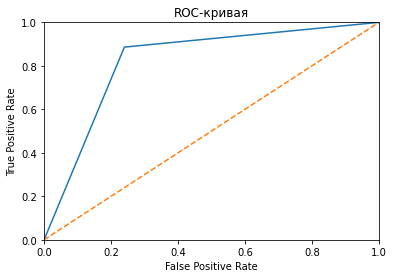

best_score_roc_auc = 0.9065445673141515


In [45]:
print("Confusion Matrix for test data:")
print(confusion_matrix(target_test_cat, predict_cat))
print()
print("Classification Report for test data:")
print(classification_report(target_test_cat, predict_cat))

# Смотрим отчет и ROC кривую
fpr, tpr, thresholds = roc_curve(target_test_cat, predict_cat)

plt.figure()
plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-кривая')
plt.show()
print(f'best_score_roc_auc = {roc_auc_score(target_test, pipe.predict_proba(features_test)[:, 1])}')

> Я достиг метрики roc_auc_score = 0.831 что неплохой результат и в predict_proba 0.91 что занчительно превосходит самую максимальную оценку в критериях

### Сравниваем выбранную модель с константной моделью (DummyClassifier)

In [46]:
Dummy_Classifier = DummyClassifier(
    random_state=RS
).fit(
    features_train,
    target_train
)

predict_Dummy = Dummy_Classifier.predict(features_test)

f1 = f1_score(target_test_cat, predict_Dummy)
accuracy = accuracy_score(target_test_cat, predict_Dummy)
roc_auc = roc_auc_score(target_test_cat, predict_Dummy)

print(f'f1_score ={f1}, accuracy = {accuracy}, roc_auc_score = {roc_auc}')
print(f'best_score_roc_auc predict_proba = {roc_auc_score(target_test, Dummy_Classifier.predict_proba(features_test)[:, 1])}')

f1_score =0.8468350278779928, accuracy = 0.7343572241183163, roc_auc_score = 0.5
best_score_roc_auc predict_proba = 0.5


> Выбранная модель показвла себя гораздо лучше чем константная модель

### Делаем выводы по обученной модели и значимость выбранных признаков

In [48]:
model.get_feature_importance(prettified=True)

,Feature Id,Importances
0,lifetime_d,18.750823
1,lifetime_m,12.687536
2,lifetime_y,11.215732
3,total_changes,8.624140
4,monthly_charges,8.110113
5,total_changes_in_d,4.604121
6,payment_method,4.323716
7,type,4.296824
8,sum_dop_uslug,3.163125
9,total_changes_in_y,2.760900


> По результатам исследования в нашем датафреме самая лучшая фича это сколько дней с нами был клиент, но при детальной рассммотернии если убрать часть строк из датафрема котоыре не оказываеют сильное влияния на таргет. То итоговые метрики не менялись при снижениии фич, поэтому было принято решение не убирать вообще любые столбцы из исходного df

## Вывод по проделанной работе

> В этой практической работе:
- Я исследовал данные, провел первичный анализ EDA что позволило составить план работы по задаче бинарной класификации
- Заполнили пропуски в данных, переименовали столбцы, а так же придумали новые фичи которые значительно улучшили результаты модели
- Перебрали кучу моделей машинного обучения в том числе их гиперпараметры и выбрали самую подходящую, в данной задаче лучше всего справился кетбуст
- Выполнили обучение лучшей модели через пайплайн и протетировали ее на тестовой отложенной выборке и достигли результатов AUC ROC predict_proba 0.91, а так же сравнили нашу лучшую модель с константной моделью и доказали ее полезность разработаной MVP модели для бизнеса

**************
## Отчет по MVP
**************
### Введение проблемы

Оператор связи `Ниединогоразрыва.ком` столкнулся с проблемой прогнозирования оттока клиентов.

Потому была видвинута гипотеза о том что если клиент захочет уйти от провайдера, то ему будут предложены промокоды и специальные условия для удержания клиента в компании.

Команда оператора собрала данные по услугам:
- Телефонной стационарной связи
- Пользования услугами интернет по двум каналам DSL и Fiber optic
- Стриминговое телевиденье
- Каталог фильмов доступные для аренды и покупки

А так же услуги:
- Антивирус
- Блокировка небезопасных сайтов
- Выделенная линия технической поддержки

В данной работе мы сосредоточимся на задаче бинарной класификации для внутреннего сервиса, где на вход будет подаваться id клиента и его индивидуальный набор услуг, а на выходе будет ответ от сервиса удет ли клиент в ближайшее время или нет по средствам ответа True или False.

После созвона с тимлидом проекта было принято решение разработать MVP проект для оператора связи, согласно этому плану действий.

Анализ df
- [x] EDA через ProfileReport
- [x] Создаем df для хранения результатов обучения несколькими моделями по метрикам F1, AUC-ROC и Accuracy

Предобработка данных
- [x] Переименовать столбцы df привести к нижнему регистру
- [x] Заполнить все пустые значения отдельной категорией no_data для текстовых значений или 0 для числовых
- [x] Изменить тип данных у df к которому больше советуют значения
- [x] Придумать новые фичи на основе имеющихся данных (дата, срок жизни и тд)
- [x]  Выбрать столбца только с самой высокой корреляцией с полем таргета
- [x] Закодировать категориальные признаки

Обучение модели через Pipline
- [x] Разбиение df на обучающую и тестовую выборку 75-25
- [x] Масштабируем признаки
- [x] Подбираем гиперпарметры через RandomizedSearchCV
- [x] Выполняем кросс валидацию
- [x] Записываем результаты обучения

Тестирование MVP
- [x] Тестируем выбранную модель на тестовой выборке
- [x] Сравниваем выбранную модель с константной моделью (DummyClassifier)
- [x] Строим графики ROC кривой и смотрим отчет о категоризации (confusion_matrix, classification_report)
- [x] Делаем выводы по обученной модели и значимость выбранных признаков

**************
### Набор данных

Нам предоставили набор исторических данных о клиентах провайдера за несколько лет. Клиентам доступны разные виды расчета за услуги(ежемесячная оплата, контракт на 1 или 2 года).

- `contract.csv` — информация о договоре с клиентом
- `personal.csv` — персональные данные клиента по контракту с оператором связи
- `internet.csv` — информация об интернет-услугах потребляемые клиентом
- `phone.csv` — информация об услугах телефонии потребляемые клиентом

В данных файлах `customerID` является кодом клиента, в поле EndDate содержится информация ошел ли клиент из компании или нет, данная выгрузка из база является актуальной на 1 февраля 2020 года.

Для первичного EDA анализа был выбран ProfileReport который позволяет посмотреть на данные со всех сторон, в том числе матрицу корреляции признаков в нашей модели.
<a href="https://ibb.co/5xVgCvw"><img src="https://i.ibb.co/5xVgCvw/image.png" alt="image" border="0"></a>
**************
### Особенности и обработка

Первоначально при анализе данных был выявлен паттерн что в части данных которые отвечают за услуги компании были обнаружены пропуски в данных, после консультации с тимлидом проекта было принято решение заполнить эти пропуски в данных отсутвием данной услуги у клиента на момент выгрузки данных. Так же в полях с категориальной информацией мы заполнили пропуски категорией No_data.

После заполнения пропусков в данных мы создали поле таргета из поля end_contract, а так же создали новые фичи такие как сколько дней, месяцев, лет прошло с момента подключения провайдера. Сколько клиент в месяц генирировал количесво невозвратной суммы, количесво подключенных доп услуг  и других...

Далее мы предусмотрели тот факт что в случае внеднения заказчиком нового поля или услуги данный MVP проект не потерял в качестве и использовал все новые поля которые будут добавлены в проект.

При кодировании данных мы столкнулись с проблемой серьезного расширения DF за счет кодирования категориальных признаков техникой OHE, однако проанализировав альтернативы мы остановились на Target Encoder который кодирует средним значением целевой метки по данному значению категориального признака, в следсвии чего это нам позволило не так сильно наш увеличить DF.

Интересно то что в процессе обучения модели и выявления самых влияющих фичей, мы попытались оставить в итоговом df только те поля которые сильно коррелируют с полем таргета. Однако снижение размерности df не дало нам сильного прироста метрик ROC-AUC и F1 в этом задании.

Итоговая матрица корреляции признаков в df получилась такая
<a href="https://ibb.co/Jq6Gn3y"><img src="https://i.ibb.co/Jq6Gn3y/image.png" alt="image" border="0"></a>
**************
### Модели и методы

В данном проекте мы пробовали применить немколкьо моделей машинного обучения, простую с точки зрения интерпретируемости модели
- LogisticRegression

Ансамблевые модели
- RandomForestClassifier
- DecisionTreeClassifier

Модели бустинга
- GradientBoostingClassifier
- CatBoostClassifier

При обучении моделей мы подготовили несколько функций для хранения результатов и подбора гиперпараметров через RandomizedSearchCV(выбрали его в виду поиска оптимальных параметров) с обязательно кроссвалидацией результата. Так как это было важно выполнить по требованиям тимлида плюс контроля переобучения моделей
**************
### Результаты и обсуждение

По результатам подбора гиперпараметров победила модель гадиентного бустинга, однако при повторном ее обучении уже с использованием PipeLine данная модель показала на тестовом df более худшие результаты чем CatBoostClassifier. Поэтому для MVP был выбран именно CatBoostClassifier
**************
### Вывод

По результатам работы мы подготовили MVP модель которая отвечат требования оператора связи и помогает решить задачу бинарной класификации уйдет или клиент или нет. После внеденеия данного MVP проекта оператор `Ниединогоразрыва.ком` стал более уверенно чуствовать себя на рынке, а так же это позволило ему удержать ключевых клиентов которые были готовы перейти к конкурентам в ближайшее время и предоставить им сочные условия дальнешего сотрудничества.
**************
### Ответы на вопросы тимлида

1. Какие пункты плана были выполнены, а какие — нет (поясните почему)? - Были выполнены все пункты плана который был заложен изначально, кроме подбора гиперпараметров через pipeLine к сожалению не удалось оперативно изучить как он работал.
2. Какие трудности возникли и как вы их преодолели? - Понимание pipeLine потребовалась помошь в обьянении коллег после их подробного обьянения и просмотра пару видео индусов я смог его применить при тетированиии выбранном модели
3. Какие ключевые шаги в решении задачи выделили? - Я бы ключевыми шагами выделил подбор гиперпараметров и тестирование лучшем модели, ну и конечно генерацию новых фичей это сильно поднапрягло мой мозг
4. Какая ваша итоговая модель и какое у неё качество? - CatBoostClassifier результаты на тестовой выборке AUC ROC predict_proba 0.91
**************


При работе с моделью было принято решение не удалять никакие признаки так как это не сказывалось на итоговой оценке по результатам многочисленных подходов.

Вот эти 10 признаков обказались самыми важными при работе с моделью:

<a href="https://ibb.co/LJm04FC"><img src="https://i.ibb.co/LJm04FC/Screenshot-1.png" alt="Screenshot-1" border="0"></a>

Первые 3 были получены из времени жизни клиента, так же мы сгенирировали фичу которая показывала сколько в день клиент генерит невозратную сумму, плюсом хорошо так же себя показали фича сумма дополнительных услуг у клиента и невозратная сумма за год жизни клиента